# Unsupervised clustering
Creation date 06.2023

The goal of the present notebook is to refine unsupervised clusters for the classification of hand poses in early modern paintings.

In this notebook, we will:
- Load the kps features
- Scale the features (+potentialy use PCA)
- Clustering using Kmeans
- Defining the right amount of clusters
- Visual check of the 

In [1]:
import os
import re
import cv2
import threading
import time
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import sys
import imageio
import random
import sqlite3
import itertools
import json
import shutil
import ntpath
import pandas as pd

from time import sleep
from datetime import datetime
#from ipynb.fs.full.write_html import write_html, write_js
from random import randint
from random import randrange

In [2]:
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
import plotly.express as px
import plotly.graph_objects as go
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import (
    Isomap,
    LocallyLinearEmbedding,
    MDS,
    SpectralEmbedding,
    TSNE,
)

In [3]:
from IPython.display import Image, display

In [4]:
import sys  
sys.path.insert(0, '../')
import KPmanager

In [5]:
IMG_PATH = "/home/bernasconi/Documents/Bernasconi/res/openpose_std_res_output_hands_CLEANED_08_2021/"
IMG_ALL_PATH = "/home/bernasconi/Documents/Bernasconi/PhD_database/biblhertz_images"
HAND_IMG_PATH = "/home/bernasconi/Documents/Bernasconi/PhD_database/output_hands_CLEANED_07_2023/"
KP_PATH = "/home/bernasconi/Documents/Bernasconi/res/output_img/"
DB_PATH = "/home/bernasconi/Documents/Bernasconi/PhD_database/biblhertz_UPDATE_08_2022.db"
CLASSIFICATION_PATH = "/home/bernasconi/Documents/Bernasconi/PhD_clusters/"

In [6]:
with open('../all_hands_features_JOINT_UNIT.pkl', 'rb') as handle:
    hands_features = pickle.load(handle)
with open('../all_hands_features_ANGLE_Kashi_UNIT.pkl', 'rb') as handle:
    hands_features_Kashi = pickle.load(handle)
with open('../all_hands_images.pkl', 'rb') as handle:
    files_name = pickle.load(handle)

In [7]:
#Create a df to keep trace of features and corresponding file names
df_fts_files = pd.DataFrame(list(zip(hands_features_Kashi, files_name)), columns =['features', 'files']) 
df_fts_files.head(5)

,features,files
0,"[2.850858402338784, 3.0583793881083907, 3.0744...",bhim00037788_0_hand_right.jpg
1,"[2.8396286207032557, 2.487077824338546, 2.3953...",bhim00037788_0_hand_left.jpg
2,"[2.5346317036638704, 2.767444337290745, 2.7555...",bh012186_0_hand_right.jpg
3,"[1.3185905362609442, 2.2200972743233294, 3.124...",bh013263_0_hand_right.jpg
4,"[2.8863749703497374, 2.267737478775054, 2.3794...",bh013263_0_hand_left.jpg


In [8]:
handedness_labels = []
for file in files_name:
    if "right" in file:
        handedness_labels.append("right")
    if "left" in file:
        handedness_labels.append("left")

## Function definition

In [9]:
def getKeypoints(df):
    """
    X_left, Y_left =  [], []
    X_right, Y_right =  [], []
    """
    
    XY_right = []
    XY_left = []
    
    XY = []
    
    hand_type = []
    
    hand_name = []

    for index, row in df.iterrows():  

        hand_left = row['hand_left_keypoints_2d']
        hand_right = row['hand_right_keypoints_2d']

        if any(hand_right) and sum(1 for number in hand_right if number < 0) <= 0:
            xy = KPmanager.getXY(hand_right)
            """
            x,y = zip(*xy)
            X_right.append(x)
            Y_right.append(y)
            """
            XY_right.append(xy)
            XY.append(xy)
            hand_type.append(1) #1==right
            img_name = row['img_id']+"_"+str(row['person_id'])+"_hand_right.jpg"
            hand_name.append(img_name)

        if any(hand_left) and sum(1 for number in hand_left if number < 0) <= 0:
            xy = KPmanager.getXY(hand_left)
            """
            x,y = zip(*xy)
            X_left.append(x)
            Y_left.append(y)
            """
            XY_left.append(xy)
            XY.append(xy)
            hand_type.append(0) #0==left
            img_name = row['img_id']+"_"+str(row['person_id'])+"_hand_left.jpg"
            hand_name.append(img_name)
            
    return XY_right, XY_left, XY, hand_name, hand_type

In [10]:
"""
THIS IS NOT WORKING BECAUSE IF YOU SWAP FOR ONE TYPE OF HAND, YOU ERASE THE FILE OF THE OTHER EXISTING TYPE
## functions to swap the hand in the filename 
def change_hand(file_dec, hand='right', new_hand='left'):
    new_file = ''
    file_dec[-2] = new_hand
    for el in file_dec:
        if el == 'jpg':
            new_file = new_file.rstrip('_')+'.jpg'
        else:
            new_file+= el+'_'
            
    return new_file
    
def correct_filename(file):
    file_dec = re.split(r'[._]', file)
    if file_dec[-2] == 'left':
        new_file = change_hand(file_dec, 'left', 'right')
    else:
        new_file = change_hand(file_dec)
        
    return new_file"""

In [10]:
def printfig(projections, image_name):
    symbols = ['circle-open', 'x-thin-open']
    colors = ['#A1CCD1', '#F4D160']

    fig = px.scatter(
        projections, x=0, y=1,
        color = handedness_labels, 
        symbol = handedness_labels,
        labels={'symbol': 'hand type'}, 
        width=1000, height=800,
        #labels={'color': 'categories', 'symbol': 'hand type'}, width=1000, height=800,
        symbol_sequence = symbols, color_discrete_sequence = colors, 
        render_mode = 'svg'
    )

    fig.update_layout(plot_bgcolor="rgba(0,0,0,0)")
    fig.update_layout(legend_traceorder="grouped", legend_title_text="Hand type")
    fig.update_xaxes(visible=False, showticklabels=False)
    fig.update_yaxes(visible=False, showticklabels=False)
    fig.update_layout(font=dict(size=16,))
    fig.update_traces(marker=dict(size=10))

    fig['data'][0]['showlegend']=True
    
    fig.write_image(image_name, scale=6)
    fig.show()
    
def printfiglabelled(projections, labels, image_name):
    symbols = ['circle-open', 'x-thin-open']
    colors = ['blue', 'red', 'yellow', 'orange', 'green', 'sienna', 'red', 'dimgray', 'magenta', 'aqua', 'lime']

    textCoord = [str(i) for i in labels]

    fig = px.scatter(
        projections, x=0, y=1,
        color=labels, 
        #symbol = handedness_labels,
        symbol = labels,
        ##labels={'color': 'categories'}, width=1000, height=800,
        labels={'color': 'categories', 'symbol': 'hand cluster'}, width=1000, height=800,
        symbol_sequence = ['circle', 'square', 'diamond', 'cross', 'x', 'triangle-up', 'triangle-down', 'triangle-left', 'triangle-right', 'triangle-ne', 'triangle-se', 'star', 'star-triangle-up', 'star-triangle-down', 'star-square', 'star-diamond'], #textCoord,#symbols, ##color_discrete_sequence = colors, 
        render_mode = 'svg'
    )
    
    #fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=0, ticks="outside"))
    fig.update_layout(legend_orientation="h")
    fig.update_layout(plot_bgcolor="rgba(0,0,0,0)")
    fig.update_xaxes(visible=False, showticklabels=False)
    fig.update_yaxes(visible=False, showticklabels=False)
    fig.update_layout(font=dict(size=16,))
    fig.update_traces(marker=dict(size=10))

    fig.write_image(image_name, scale=6)
    fig.show()

In [83]:
def cluster_occurence(labels_kmeans_):
    right_labels_kmeans = [0] * 40
    left_labels_kmeans = [0] * 40
    all_labels_kmeans = [0] * 40
    labels_ = [0] * 40

    for hand_, label_ in zip(handedness_labels, labels_kmeans_):
        if hand_ == 'right':
            right_labels_kmeans[label_] +=1
        else:
            left_labels_kmeans[label_]+=1
        all_labels_kmeans[label_]+=1
    
    occurence_df = pd.DataFrame({'all': all_labels_kmeans, 'left': left_labels_kmeans, 'right': right_labels_kmeans})
    occurence_df = occurence_df.sort_values(by='all')
    
    #occurence_df.reset_index(inplace=True)
    #occurence_df = occurence_df.rename(columns = {'index':'cluster'})
    
    occurence_df = occurence_df.astype({'all':str}, errors='raise')
    
    return occurence_df

def print_cluster_occurence(occurence_df_, image_name, width_=0.5, bar_space = False):
    #fig, ax = plt.subplots(figsize=(20, 10))
    
    if bar_space:
        plt.rcParams["figure.figsize"] = (35, 10)
        plt.rcParams.update({'font.size': 20})

        ax = occurence_df_.plot.bar(stacked=True, color={"left": "#A1CCD1", "right": "#F4D160"}, width=width_)
        # create data
        x = list(range(40))

        ax.spines[['top', 'right']].set_visible(False)
        #ax.set_xticks(np.arange(len(left_labels_kmeans)))
        # plot bars in stack manner,
        #plt.bar(occurence_df_.index, occurence_df_['left'], color='#A1CCD1') #blue
        #plt.bar(occurence_df_.index, occurence_df_['right'], bottom= occurence_df_['left'], color='#F4D160') #yellow
        #bar = occurence_df.plot.bar(stacked=True)

        ax.legend(labels=['left', 'right'])
        ax.grid(axis='y', zorder=2.5)
        ax.set_axisbelow(True)
        ax.set_ylabel('Total images')
        ax.set_xlabel('Cluster number')
        plt.savefig(image_name, dpi=300)
        plt.show()
    else:
        plt.rcParams["figure.figsize"] = (20, 10)
        
        ax = occurence_df_.plot.bar(stacked=True, color={"left": "#A1CCD1", "right": "#F4D160"}, width=width_)
        # create data
        x = list(range(40))

        ax.spines[['top', 'right']].set_visible(False)
        #ax.set_xticks(np.arange(len(left_labels_kmeans)))
        # plot bars in stack manner,
        #plt.bar(occurence_df_.index, occurence_df_['left'], color='#A1CCD1') #blue
        #plt.bar(occurence_df_.index, occurence_df_['right'], bottom= occurence_df_['left'], color='#F4D160') #yellow
        #bar = occurence_df.plot.bar(stacked=True)

        ax.legend(labels=['left', 'right'])
        ax.grid(axis='y', zorder=2.5)
        ax.set_axisbelow(True)
        ax.set_ylabel('Total images')
        ax.set_xlabel('Cluster number')
        plt.savefig(image_name)
        plt.show()

In [12]:
##create folders and dispatch the hands in the different clusters for a visual check
def visual_check(dir_name, labels_, files_name, n_clusters = 50, origin = HAND_IMG_PATH):
    os.makedirs(dir_name, exist_ok=True)
    for i in range(n_clusters):
        os.makedirs(dir_name+"/"+str(i), exist_ok=True)
    for label, filename in zip(labels_, files_name):
        try:
            shutil.copy(origin+filename, dir_name+"/"+str(label)+"/"+filename)
        except:
            print("Issue with file ", filename)
            continue

In [13]:
from sklearn.metrics import pairwise_distances

def find_centroid_l_r(centroids, files_name_):
    main_file = files_name_[int(centroids[0])]
    
    if 'right' in main_file:
        to_find = 'left'
    else:
        to_find = 'right'
        
    for i in centroids:
        if to_find in files_name_[int(i)]:
            return(main_file, files_name_[int(i)])
    return(main_file, files_name_[int(centroids[1])])
    
def get_centroid_images(kmeans_ft_, labels_kmeans_, hand_features_, files_name_, l_r = False):
    centroids_  = kmeans_ft_.cluster_centers_
    centroid_labels_ = [centroids_[i] for i in labels_kmeans_]
    
    hand_ftrs = np.array(hand_features_)
    
    distances = pairwise_distances(centroids_, hand_features_, metric='euclidean')
    
    if l_r:
        ind = [np.argpartition(i, 10)[:10] for i in distances]
        center_images_ = []
        for centroids in ind:
            center_images_.append(find_centroid_l_r(centroids, files_name_))
    else:
        ind = [np.argpartition(i, 2)[:2] for i in distances]
        closest = [hand_ftrs[indexes] for indexes in ind]
    
        center_images_ = [[files_name_[int(i)], files_name_[int(j)]] for [i,j] in ind]
            
    return center_images_

## Scaling features

In [14]:
scaler = StandardScaler()

In [15]:
scaled_hands_features_Kashi = scaler.fit_transform(hands_features_Kashi)

## K-means clustering
- Note that there is no difference between k-means and k-means++

### Amount of cluster estimation

In [10]:
wcss = []
for i in range(10, 210, 10):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state=42)
    kmeans_pca.fit(scaled_hands_features_Kashi)
    wcss.append(kmeans_pca.inertia_)

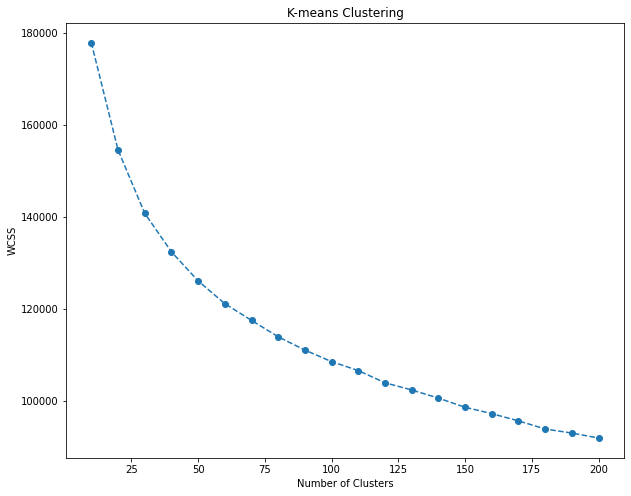

In [11]:
plt.figure(figsize = (10,8))
plt.plot(range(10, 210, 10), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.savefig("kmeans_clustering_n_clusters_estimation.jpg", dpi=300)
plt.show()

Usually, the elbow method is used to determine the right amount of clusters, here, it is difficult to estimate. Yet, Dimova made a lexicon with 30 different hand poses. There is a need to find the right trade-off between the granularity of the clusters and their analysis at larger spectrum and future readability
#### Test with 30 clusters, 40 clusters and 50 clusters
The reason is that Dimova proposes a lexicon of 30 hands

In [14]:
for i in [30, 40, 50]:
    kmeans_ft = KMeans(n_clusters=i,init = 'k-means++', random_state=0).fit(scaled_hands_features_Kashi)
    labels_kmeans = kmeans_ft.labels_
    visual_check(f"KMEANS_features_alkashi_scaled_{i}_clusters", labels_kmeans, files_name, n_clusters=i)

### K-means TSNE visualization

In [236]:
tsne = TSNE(n_components=2, learning_rate='auto', init='random')
emb_wfeat_01 = tsne.fit_transform(np.array(scaled_hands_features_Kashi))

In [239]:
printfig(emb_wfeat_01, "tsne_projection_features_alkashi_scaled.png")

In [60]:
kmeans_ft = KMeans(n_clusters=40, init = 'k-means++', random_state=0).fit(scaled_hands_features_Kashi)
labels_kmeans = kmeans_ft.labels_

In [61]:
occurence_df = cluster_occurence(labels_kmeans)

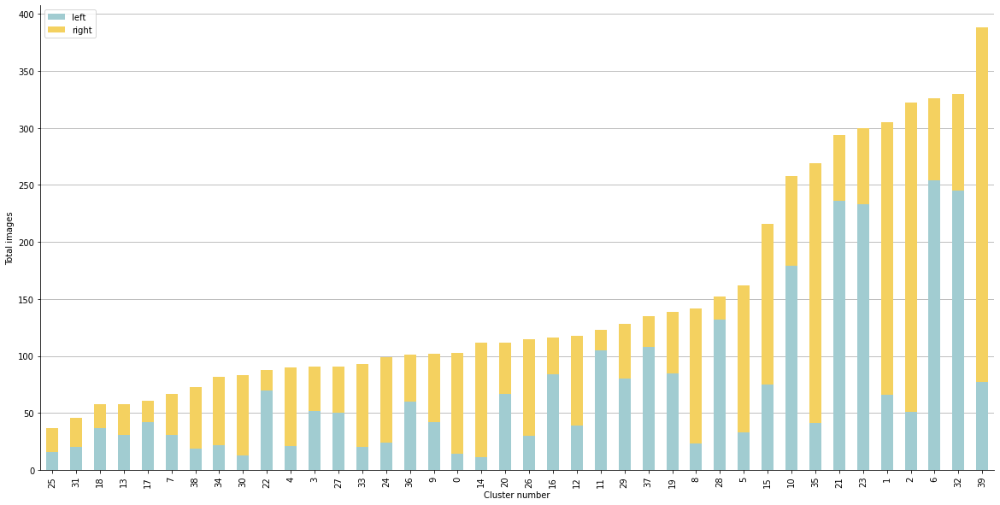

In [62]:
print_cluster_occurence(occurence_df, 'occurence_40_clusters_Kmneas_alkashi_features.jpg')

In [114]:
printfiglabelled(emb_wfeat_01, labels_kmeans, "TSNE_projection_KMEANS_alkashifeatures.png")

### K-means SPECTRAL visualization

In [109]:
spectr = SpectralEmbedding(n_components=2, random_state=0, eigen_solver="arpack")

In [110]:
spectr_emb = spectr.fit_transform(hands_features_Kashi)

In [112]:
printfiglabelled(spectr_emb, labels_kmeans, "SPECTRAL_projection_KMEANS_alkashifeatures.png")

### Check the clusters centroid

In [21]:
center_images_lr = get_centroid_images(kmeans_ft, labels_kmeans, scaled_hands_features_Kashi, files_name)

0


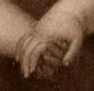

1


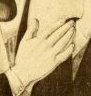

2


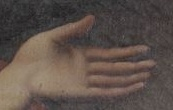

3


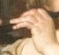

4


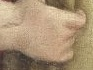

5


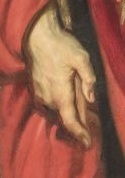

6


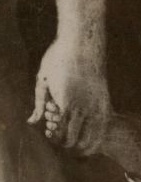

7


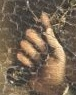

8


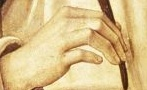

9


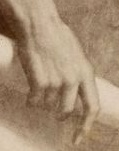

10


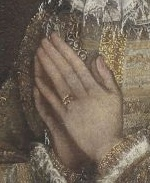

11


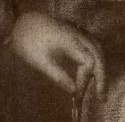

12


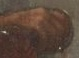

13


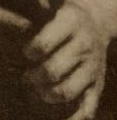

14


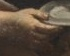

15


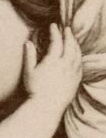

16


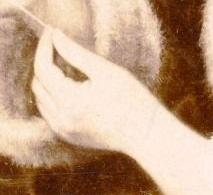

17


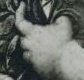

18


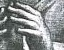

19


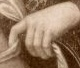

20


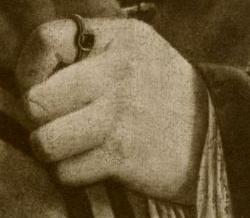

21


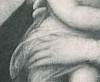

22


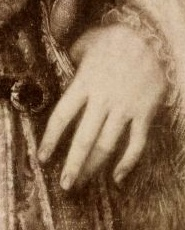

23


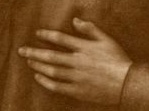

24


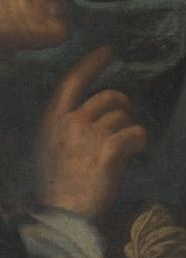

25


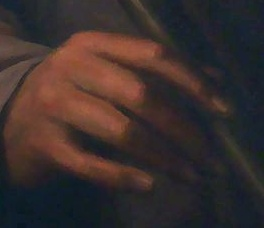

26


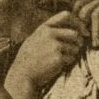

27


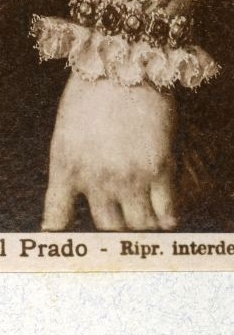

28


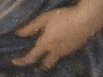

29


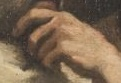

30


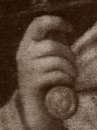

31


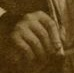

32


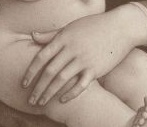

33


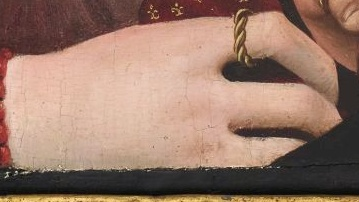

34


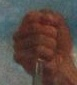

35


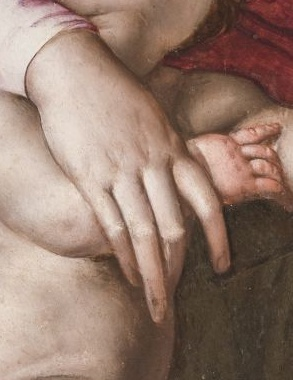

36


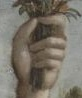

37


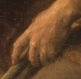

38


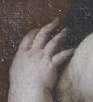

39


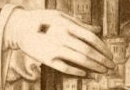

In [23]:
# Display the images
cluster_num = 0
for img0, img1 in center_images_lr:
    print(cluster_num)
    display(Image(filename=HAND_IMG_PATH +"/"+img0))
    # here we copy the images in the folder for later network illustration
    shutil.copy(HAND_IMG_PATH +"/"+img0, "KMEANS_features_alkashi_scaled_40_clusters/"+str(cluster_num)+".jpg")
    cluster_num+=1

### Save the results as DF

In [107]:
df_hands_clusters = pd.DataFrame({"hands": files_name, "cluster": labels_kmeans})

In [108]:
df_hands_clusters.head(10)

,hands,cluster
0,bhim00037788_0_hand_right.jpg,19
1,bhim00037788_0_hand_left.jpg,6
2,bh012186_0_hand_right.jpg,35
3,bh013263_0_hand_right.jpg,31
4,bh013263_0_hand_left.jpg,3
5,bhim00037212_0_hand_left.jpg,22
6,bhim00037212_1_hand_right.jpg,5
7,bhim00037212_2_hand_left.jpg,1
8,bhim00037212_3_hand_right.jpg,39
9,bhim00037212_3_hand_left.jpg,29


In [109]:
df_hands_clusters.to_csv('df_hands_clusters.csv', encoding='utf-8')

## K-means clustering with left and right hands split


### Split left and right hands

In [16]:
files_name_l = []
files_name_r = []

hand_features_kashi_l = []
hand_features_kashi_r = []

for ft, file in zip(scaled_hands_features_Kashi, files_name):
    if 'left' in file:
        files_name_l.append(file)
        hand_features_kashi_l.append(ft)
    else:
        files_name_r.append(file)
        hand_features_kashi_r.append(ft)

In [17]:
#Check the length of the features
print(len(files_name_l), len(files_name_r))
print(len(hand_features_kashi_l), len(hand_features_kashi_r))

2838 3147
2838 3147


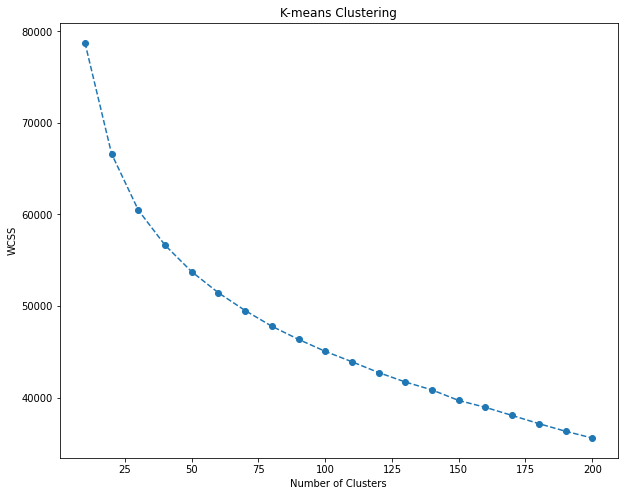

In [18]:
#Left
wcss = []
for i in range(10, 210, 10):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state=42)
    kmeans_pca.fit(hand_features_kashi_l)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize = (10,8))
plt.plot(range(10, 210, 10), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.savefig("kmeans_clustering_n_clusters_estimation_l_features.jpg", dpi=300)
plt.show()

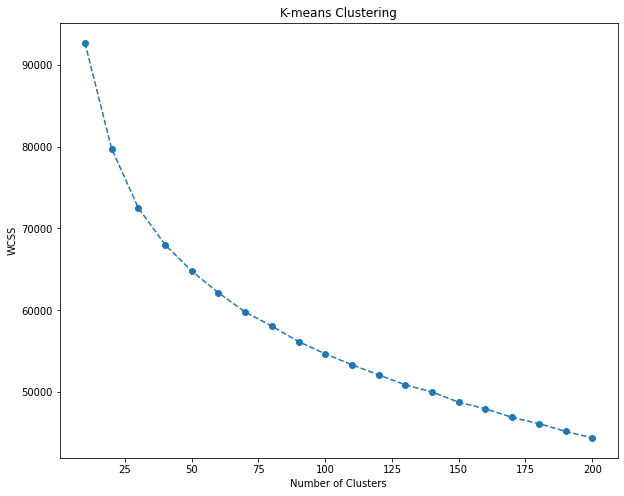

In [19]:
#Right
wcss = []
for i in range(10, 210, 10):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state=42)
    kmeans_pca.fit(hand_features_kashi_r)
    wcss.append(kmeans_pca.inertia_)
    
plt.figure(figsize = (10,8))
plt.plot(range(10, 210, 10), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.savefig("kmeans_clustering_n_clusters_estimation_r_features.jpg", dpi=300)
plt.show()

After a visual check of the clusters, it seems that 40 is a good amount of clusters

In [14]:
i = 40

kmeans_ft_l = KMeans(n_clusters=i, init = 'k-means++', random_state=0).fit(hand_features_kashi_l)
labels_kmeans_l = kmeans_ft_l.labels_
visual_check(f"KMEANS_features_alkashi_scaled_l_{i}_clusters", labels_kmeans_l, files_name_l, n_clusters=i)

kmeans_ft_r = KMeans(n_clusters=i, init = 'k-means++', random_state=0).fit(hand_features_kashi_r)
labels_kmeans_r = kmeans_ft_r.labels_
visual_check(f"KMEANS_features_alkashi_scaled_r_{i}_clusters", labels_kmeans_r, files_name_r, n_clusters=i)

### Check the clusters centroid

First create the images for the centroid

In [18]:
center_images_l = get_centroid_images(kmeans_ft_l, labels_kmeans_l, hand_features_kashi_l, files_name_l)
center_images_r = get_centroid_images(kmeans_ft_r, labels_kmeans_r, hand_features_kashi_r, files_name_r)

0


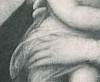

1


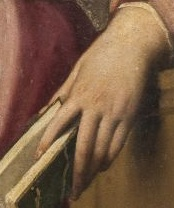

2


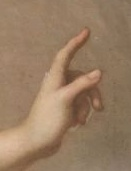

3


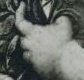

4


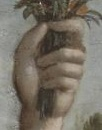

5


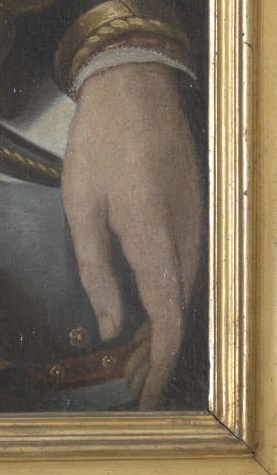

6


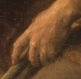

7


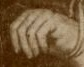

8


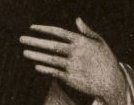

9


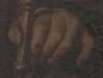

10


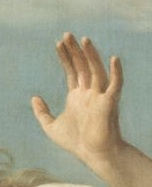

11


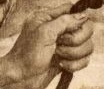

12


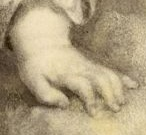

13


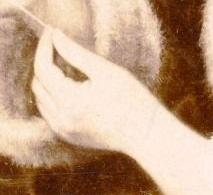

14


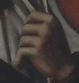

15


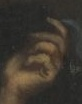

16


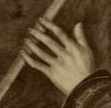

17


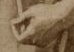

18


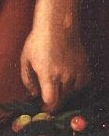

19


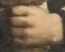

20


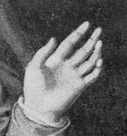

21


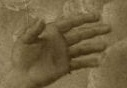

22


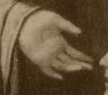

23


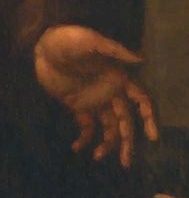

24


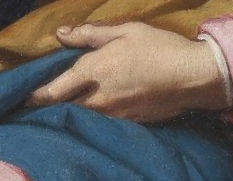

25


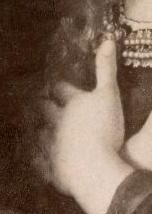

26


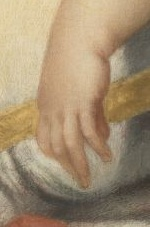

27


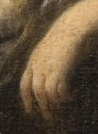

28


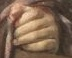

29


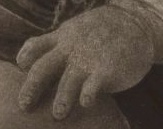

30


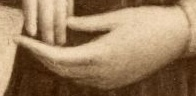

31


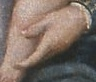

32


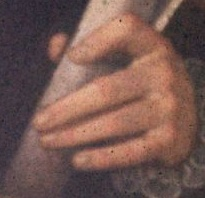

33


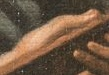

34


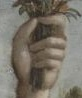

35


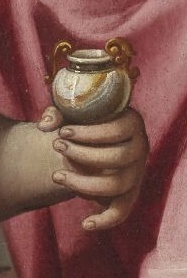

36


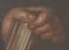

37


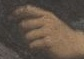

38


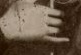

39


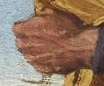

In [19]:
# Display the images
cluster_num = 0
for img0, img1 in center_images_l:
    print(cluster_num)
    display(Image(filename=HAND_IMG_PATH +"/"+img0))
    cluster_num+=1

0


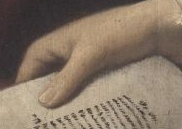

1


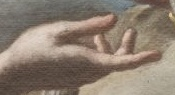

2


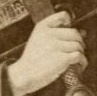

3


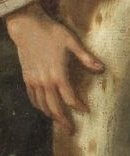

4


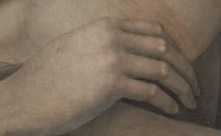

5


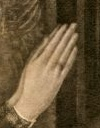

6


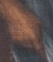

7


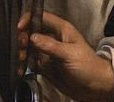

8


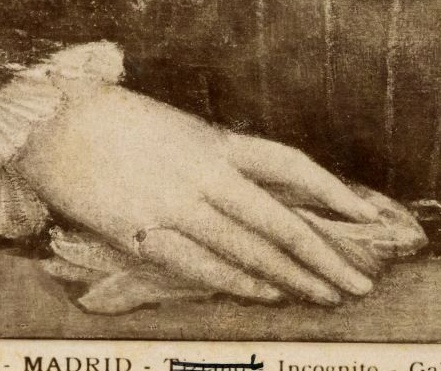

9


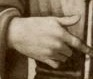

10


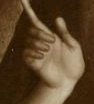

11


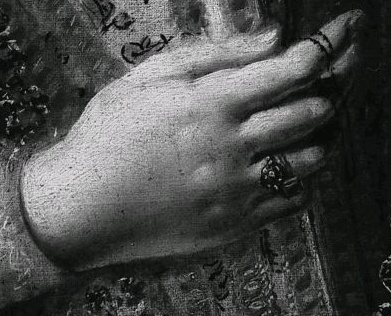

12


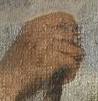

13


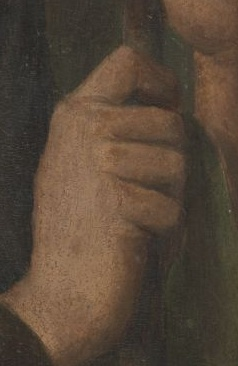

14


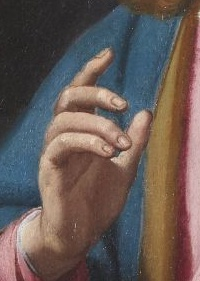

15


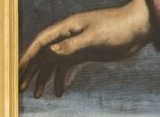

16


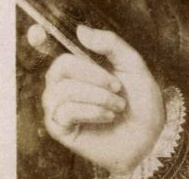

17


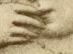

18


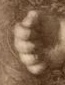

19


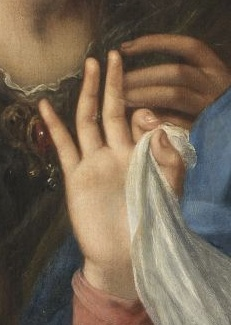

20


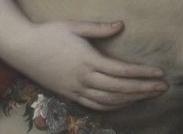

21


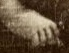

22


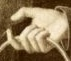

23


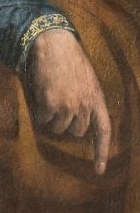

24


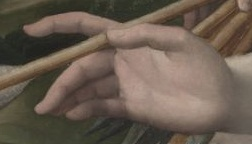

25


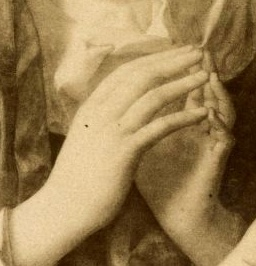

26


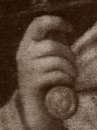

27


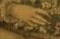

28


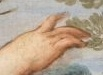

29


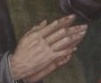

30


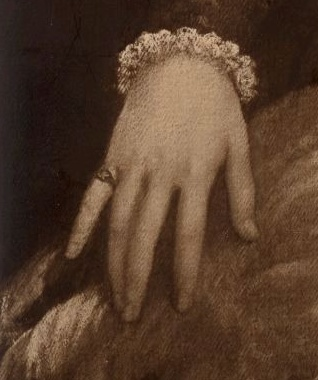

31


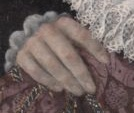

32


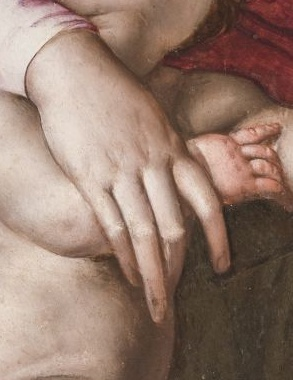

33


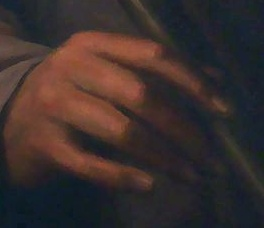

34


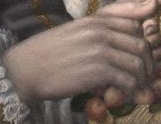

35


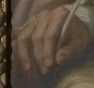

36


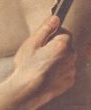

37


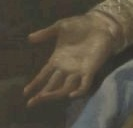

38


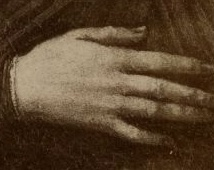

39


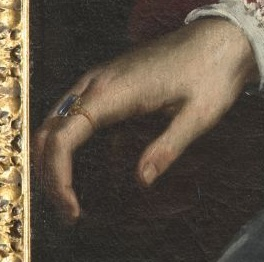

In [20]:
# Display the images
cluster_num = 0
for img0, img1 in center_images_r:
    print(cluster_num)
    display(Image(filename=HAND_IMG_PATH +"/"+img0))
    cluster_num+=1

In [75]:
from IPython.display import display, HTML

def make_html(folder, center_images_):
    html_img =""
    cluster_num = 0
    for image in center_images_:
        html_img +='<img src="{}" height="100" style="display:inline;margin:1px;"/>{}'.format(folder+image[0], cluster_num)
        cluster_num +=1
    return html_img

def write_html_file(body_l, body_r, filename):
    # Creating the HTML file
    file_html = open(filename, "w")
    # Adding the input data to the HTML file
    file_html.write('''<html>
                        <head>
                            <title>HTML File</title>
                            <style>
                                .row {{
                                  display: flex;
                                }}
                                .column {{
                                  flex: 50%;
                                }}
                                
                                .left {{
                                  width: 50%;
                                }}
                                .right{{
                                  width: 50%;
                                  border-left: 5px  solid #FFC133;
                                }}
                                /* Clear floats after the columns */
                                .row:after {{
                                  content: "";
                                  display: table;
                                  clear: both;
                                }}
                            </style>
                        </head> 
                        <body style="color:#FFC133; font-size:300%;">
                            <div class="row">
                                <div class="column left">
                                    <p>Left hand</p>
                                    {}
                                </div>
                                <div class="column right">
                                    <p>Right hand</p>
                                    {}
                                </div>
                            </div>
                        </body>
                        </html>
                    '''.format(body_l, body_r))
    # Saving the data into the HTML file
    file_html.close()

In [77]:
body_l = make_html(HAND_IMG_PATH, center_images_l)
body_r = make_html(HAND_IMG_PATH, center_images_r)
write_html_file(body_l, body_r, "right_left_hands_centroids.html")

In [ ]:
## TODO
clean left and right clusters
group left and right
count amount of left and right per cluster (plot) + left right clusters repartition as well


## K-means clustering with left hands flipped

### Flip left hands
- Split them into separate folder to check 
- Get left hands original keypoints
- Horizontal filp the keypoints
- Recompute AlKashi keypoints
- Cluster back all the hands together

In [26]:
#Get back the original keypoints
kps_df = KPmanager.getDFkeypoints(KP_PATH)

In [27]:
XY_right_, XY_left_, XY_, files_name_, hand_type_= getKeypoints(kps_df)

In [28]:
print(len(XY_right_), len(XY_left_), len(XY_), len(files_name_))

9376 9160 18536 18536


In [29]:
d = {'XY': XY_, 'files_name':files_name_, 'hand_type':hand_type_}
kps_df_ = pd.DataFrame(d)

In [30]:
image_extensions = ['.jpg', '.png', '.jpeg']   # case-insensitive (upper/lower doesn't matter)
images = [f for dp, dn, filenames in os.walk(IMG_PATH) for f in filenames if os.path.splitext(f)[1].lower() in image_extensions]#FOR ALL THE IMAGES
#XY = kps_df_['XY'].tolist()
#files_name_dup = kps_df_['files_name'].tolist()

In [31]:
kps_df_ = kps_df_[kps_df_['files_name'].isin(images)]

In [32]:
#FOR ALL THE IMAGES
XY = kps_df_['XY'].tolist()
files_name_dup = kps_df_['files_name'].tolist()

In [33]:
kps_df_

,XY,files_name,hand_type
1,"[[763.334, 1224.06], [760.486, 1229.34], [752....",bhim00037788_0_hand_right.jpg,1
2,"[[964.251, 1281.27], [946.736, 1289.54], [928....",bhim00037788_0_hand_left.jpg,0
11,"[[612.512, 916.009], [651.26, 926.938], [692.9...",bh012186_0_hand_right.jpg,1
16,"[[230.561, 1676.7], [319.098, 1564.19], [272.9...",bh013263_0_hand_right.jpg,1
17,"[[942.111, 1499.38], [900.833, 1418.89], [888....",bh013263_0_hand_left.jpg,0
...,...,...,...
18523,"[[535.041, 761.299], [558.138, 743.976], [594....",bhim00017282_0_hand_right.jpg,1
18524,"[[441.837, 1256.71], [482.116, 1185.11], [513....",bhim00017426_0_hand_right.jpg,1
18525,"[[574.112, 659.215], [590.98, 665.349], [610.4...",bhpd40465_0_hand_right.jpg,1
18527,"[[1092.93, 562.297], [1092.93, 544.63], [1103....",bhpd40465_1_hand_right.jpg,1


In [34]:
files_name_l = []
files_name_r = []
xy_l = []
xy_r = []

for index, row in kps_df_.iterrows(): 
    hand = re.split(r'[._]', row['files_name'])[-2]
    if hand == 'right':
        files_name_r.append(row['files_name'])
        xy_r.append(row['XY'])
    else:
        files_name_l.append(row['files_name'])
        xy_l.append(row['XY'])

In [35]:
dist_lst = [[2, 5], [5, 9], [13, 17], [4, 8], [8, 12], [12, 16], [16, 20]]

joints = []
prev_i = 0
for i in range(1, 21, 4):
    if i >1:
        joints.append([prev_i, 0, i])
    prev = 0
    for j in range(i, i+3):
        joints.append([prev,j,j+1])
        prev = j
    prev_i = i

bone_lst = []
for i in [1,5,9,13,17]:
    bone_lst.append([0, i])
    prev_jt = i
    for j in range(i+1, i+4):
        bone_lst.append([prev_jt, j])
        prev_jt = j

In [36]:
#Now we flip all the left hands
xy_l_flip = [[[-x,y] for [x,y] in kps] for kps in xy_l]

In [37]:
hand_ft_left = KPmanager.getJointsAngles(xy_l_flip, joints, bone_lst, keepKP = False, unitVector=True, direction=False, al_kashi = True)

474 MERGED KEYPOINTS [-1709.77, 1133.93] [-1708.29, 1126.5] [-1708.29, 1126.5]
New coordinates for b: [-1709.03, 1130.215000000002]
669 MERGED KEYPOINTS [-1263.71, 1026.99] [-1263.71, 1024.41] [-1263.71, 1024.41]
New coordinates for b: [-1263.71, 1025.7]
696 MERGED KEYPOINTS [-667.385, 1263.63] [-663.691, 1262.57] [-663.691, 1262.57]
New coordinates for b: [-665.538, 1263.1]
764 MERGED KEYPOINTS [-597.946, 908.372] [-597.946, 921.941] [-597.946, 921.941]
New coordinates for b: [-597.946, 915.1565]
1011 MERGED KEYPOINTS [-1940.62, 901.21] [-1940.62, 900.898] [-1940.62, 900.898]
New coordinates for b: [-1940.62, 901.0540000000001]
1107 MERGED KEYPOINTS [-1318.61, 1290.18] [-1310.44, 1328.53] [-1310.44, 1328.53]
New coordinates for b: [-1314.525, 1309.3549999999996]
1115 MERGED KEYPOINTS [-596.21, 959.393] [-598.042, 959.027] [-598.042, 959.027]
New coordinates for b: [-597.126, 959.21]
1116 MERGED KEYPOINTS [-1344.16, 333.042] [-1342.38, 334.11] [-1342.38, 334.11]
New coordinates for b: 

In [38]:
hand_ft_right = KPmanager.getJointsAngles(xy_r, joints, bone_lst, keepKP = False, unitVector=True, direction=False, al_kashi = True)

77 MERGED KEYPOINTS [599.289, 1252.92] [565.487, 1260.57] [565.487, 1260.57]
New coordinates for b: [582.3879999999999, 1256.7450000000001]
126 MERGED KEYPOINTS [491.876, 361.008] [476.811, 356.635] [476.811, 356.635]
New coordinates for b: [484.34349999999995, 358.8215]
378 MERGED KEYPOINTS [515.763, 1389.87] [522.073, 1390.57] [522.073, 1390.57]
New coordinates for b: [518.918, 1390.22]
650 MERGED KEYPOINTS [811.781, 1008.04] [825.504, 976.935] [825.504, 976.935]
New coordinates for b: [818.6424999999999, 992.4875]
702 MERGED KEYPOINTS [1381.61, 355.054] [1381.16, 356.634] [1381.16, 356.634]
New coordinates for b: [1381.385, 355.84400000000005]
724 MERGED KEYPOINTS [1138.61, 1365.23] [1154.32, 1349.52] [1154.32, 1349.52]
New coordinates for b: [1146.465, 1357.3750000000002]
956 MERGED KEYPOINTS [1186.39, 714.921] [1190.47, 716.857] [1190.47, 716.857]
New coordinates for b: [1188.43, 715.889]
984 MERGED KEYPOINTS [733.939, 1655.07] [737.349, 1655.07] [737.349, 1655.07]
New coordinates

In [39]:
hands_features_Kashi_flip = hand_ft_right + hand_ft_left
files_name_lr = files_name_r + files_name_l

In [38]:
#Save everything
#with open('all_hands_features_ANGLE_Kashi_UNIT_FLIPPED.pkl', 'wb') as handle:
 #   pickle.dump(hands_features_Kashi_flip, handle, protocol=pickle.HIGHEST_PROTOCOL) 
    
#with open('all_hands_images_Kashi_flipped.pkl', 'wb') as handle:
 #   pickle.dump(files_name_lr, handle, protocol=pickle.HIGHEST_PROTOCOL) 

### TSNE + KMeans check

In [40]:
tsne = TSNE(n_components=2, learning_rate='auto', init='random')
emb_feat_flip = tsne.fit_transform(np.array(hands_features_Kashi_flip))

In [40]:
printfig(emb_feat_flip, "tsne_projection_handfeatures_flipped.png")

In [41]:
#Scale hand features
scaled_hands_features_Kashi_flip = scaler.fit_transform(hands_features_Kashi_flip)

In [42]:
kmeans_ft = KMeans(n_clusters=50, random_state=0).fit(scaled_hands_features_Kashi_flip)#fit(scaled_hand_ft_left)#

In [43]:
labels_kmeans = kmeans_ft.labels_

In [83]:
printfiglabelled(emb_feat_flip, labels_kmeans, "TSNE_projection_KMEANS_handfeatures_scaled_flipped.png")

In [82]:
visual_check(f"KMEANS_features_alkashi_scaled_flipped_50_clusters", labels_kmeans, files_name_lr, n_clusters=50)

### Amount of clusters estimation

In [87]:
wcss = []
for i in range(10, 210, 10):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state=42)
    kmeans_pca.fit(scaled_hands_features_Kashi_flip)
    wcss.append(kmeans_pca.inertia_)

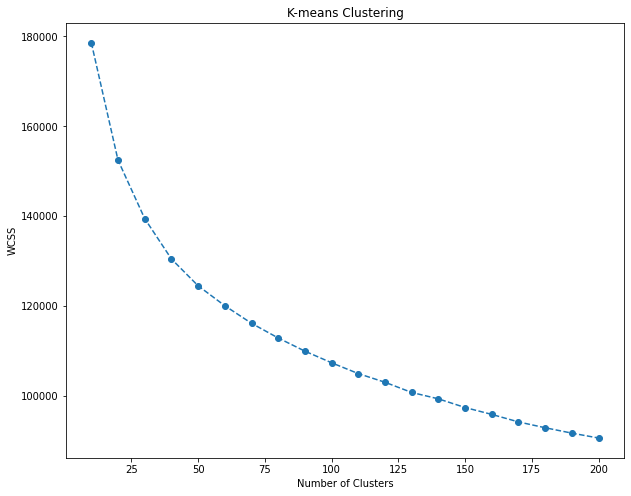

In [88]:
plt.figure(figsize = (10,8))
plt.plot(range(10, 210, 10), wcss, marker = 'o', linestyle = '--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('K-means Clustering')
plt.savefig("kmeans_clustering_n_clusters_estimation_features_flipped.jpg", dpi=300)
plt.show()

In [64]:
kmeans_ft = KMeans(n_clusters=40, random_state=0).fit(scaled_hands_features_Kashi_flip)

In [65]:
labels_kmeans = kmeans_ft.labels_

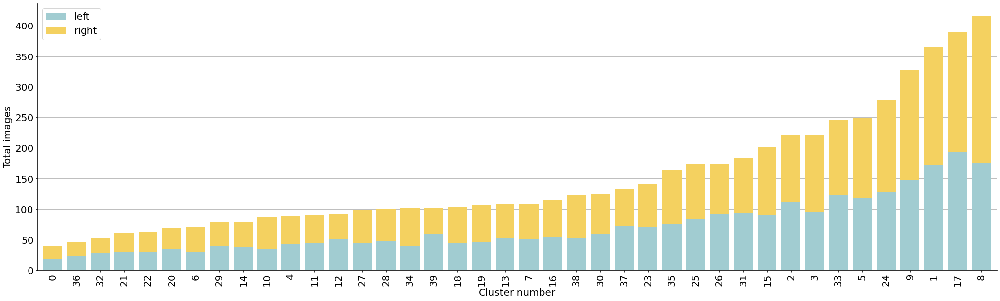

In [84]:
occurence_df = cluster_occurence(labels_kmeans)
print_cluster_occurence(occurence_df, 'occurence_40_clusters_Kmneas_alkashi_features_flipped_width.jpg', width_=0.8, bar_space=True)

In [45]:
printfiglabelled(emb_feat_flip, labels_kmeans, "TSNE_projection_KMEANS_handfeatures_scaled_flipped_40_clusters.png")

In [92]:
visual_check(f"KMEANS_features_alkashi_scaled_flipped_40_clusters", labels_kmeans, files_name_lr, n_clusters=40)

In [112]:
"""
Test with 10 clusters
As we can see, the most salient features are the one for the orientation of the hands 
(see below confirmed with Spectral)
"""
kmeans_ft = KMeans(n_clusters=10, random_state=0).fit(scaled_hands_features_Kashi_flip)

In [113]:
labels_kmeans = kmeans_ft.labels_

In [114]:
visual_check(f"KMEANS_features_alkashi_scaled_flipped_10_clusters", labels_kmeans, files_name_lr, n_clusters=10)

In [95]:
printfiglabelled(emb_feat_flip, labels_kmeans, "TSNE_projection_KMEANS_handfeatures_scaled_flipped_10_clusters.png")

In [108]:
kmeans_ft = KMeans(n_clusters=30, random_state=0).fit(scaled_hands_features_Kashi_flip)
labels_kmeans = kmeans_ft.labels_

In [109]:
printfiglabelled(emb_feat_flip, labels_kmeans, "TSNE_projection_KMEANS_handfeatures_scaled_flipped_30_clusters.png")

In [111]:
visual_check(f"KMEANS_features_alkashi_scaled_flipped_30_clusters", labels_kmeans, files_name_lr, n_clusters=30)

### Spectral visualization

In [96]:
spectr = SpectralEmbedding(n_components=2, random_state=0, eigen_solver="arpack")

In [97]:
spectr_emb = spectr.fit_transform(hands_features_Kashi_flip)

In [98]:
printfiglabelled(spectr_emb, labels_kmeans, "SPECTRAL_projection_KMEANS_alkashifeatures_flip_10_clusters.png")

In [103]:
printfiglabelled(spectr_emb, labels_kmeans, "SPECTRAL_projection_KMEANS_alkashifeatures_flip_40_clusters.png")

In [106]:
printfiglabelled(spectr_emb, labels_kmeans, "SPECTRAL_projection_KMEANS_alkashifeatures_flip_50_clusters.png")

In [110]:
printfiglabelled(spectr_emb, labels_kmeans, "SPECTRAL_projection_KMEANS_alkashifeatures_flip_30_clusters.png")

### Check the clusters centroid

In [97]:
center_images_lr_flip = get_centroid_images(kmeans_ft, labels_kmeans, scaled_hands_features_Kashi_flip, files_name_lr, True)

0


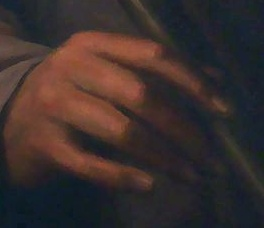

1


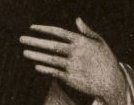

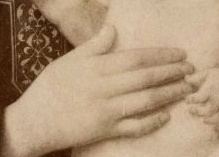

2


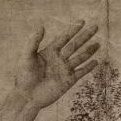

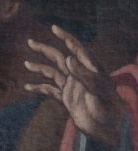

3


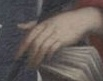

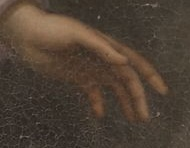

4


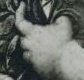

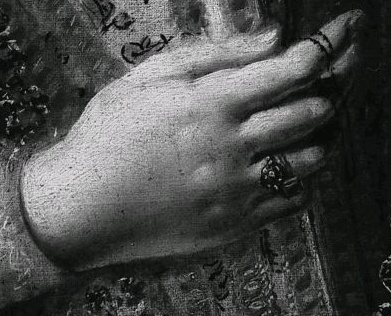

5


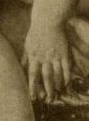

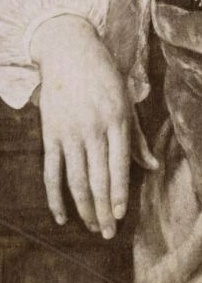

6


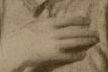

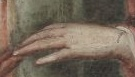

7


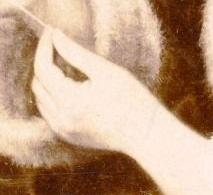

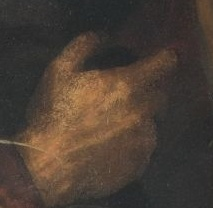

8


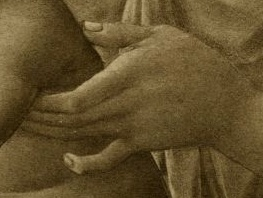

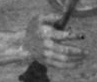

9


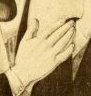

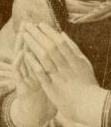

10


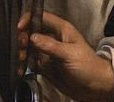

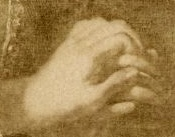

11


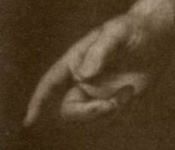

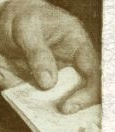

12


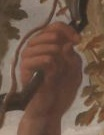

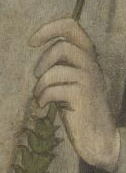

13


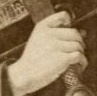

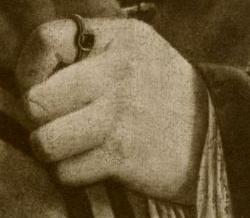

14


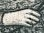

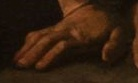

15


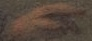

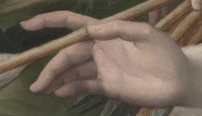

16


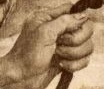

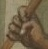

17


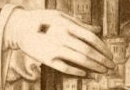

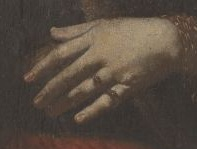

18


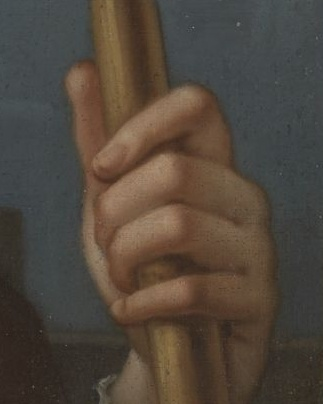

19


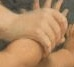

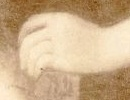

20


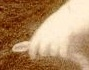

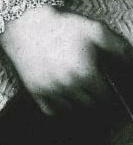

21


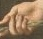

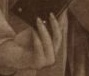

22


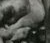

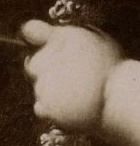

23


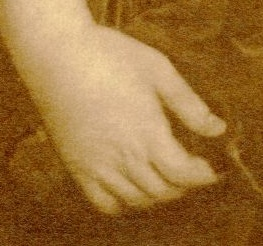

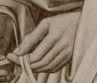

24


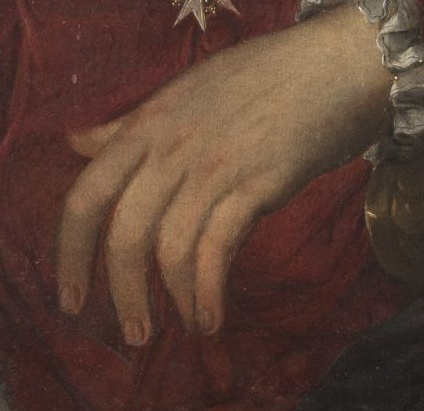

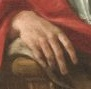

25


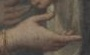

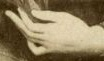

26


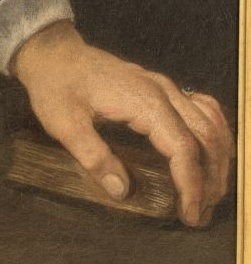

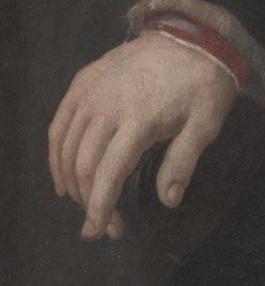

27


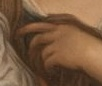

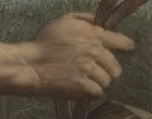

28


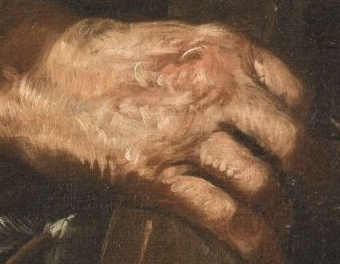

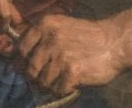

29


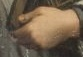

30


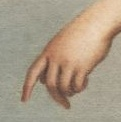

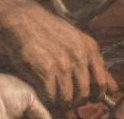

31


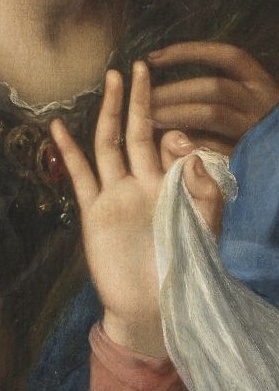

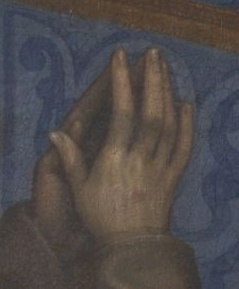

32


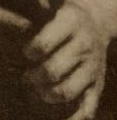

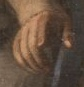

33


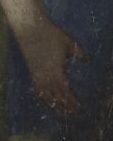

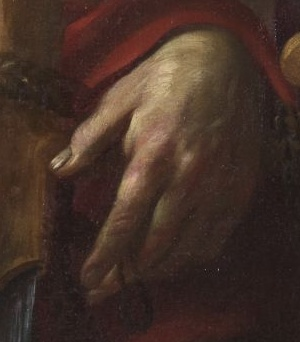

34


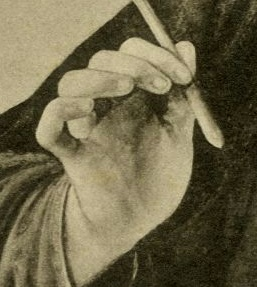

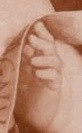

35


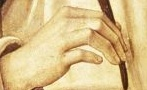

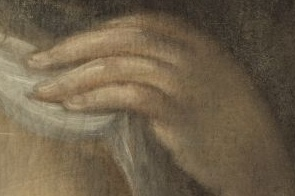

36


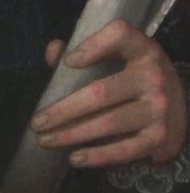

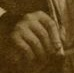

37


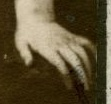

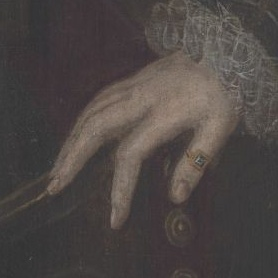

38


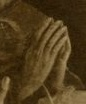

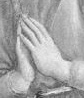

39


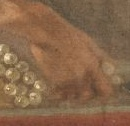

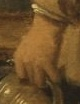

In [98]:
cluster_num = 0
for img0, img1 in center_images_lr_flip:
    print(cluster_num)
    display(Image(filename=HAND_IMG_PATH +"/"+img0))
    display(Image(filename=HAND_IMG_PATH +"/"+img1))
    # here we copy the images in the folder for later network illustration
    
    shutil.copy(HAND_IMG_PATH +"/"+img0, "KMEANS_features_alkashi_scaled_flipped_40_clusters/"+str(cluster_num)+"_"+re.split(r'[._]', img0)[-2]+".jpg")
    shutil.copy(HAND_IMG_PATH +"/"+img1, "KMEANS_features_alkashi_scaled_flipped_40_clusters/"+str(cluster_num)+"_"+re.split(r'[._]', img1)[-2]+".jpg")
    cluster_num+=1

### Save results as DF

In [101]:
df_flipped = pd.DataFrame({"hands": files_name_lr, "cluster": labels_kmeans})

In [103]:
df_flipped.head(5)

,hands,cluster
0,bhim00037788_0_hand_right.jpg,26
1,bh012186_0_hand_right.jpg,5
2,bh013263_0_hand_right.jpg,36
3,bhim00037212_1_hand_right.jpg,33
4,bhim00037212_3_hand_right.jpg,24


In [105]:
df_flipped.to_csv('df_hands_clusters_flipped.csv', encoding='utf-8')